In [77]:
from datetime import datetime, timezone
from html import escape
from importlib import reload
from importlib.util import find_spec
from pathlib import Path
import sys

required = ("numpy", "pandas", "plotly", "sklearn", "IPython", "energy_analytics")
missing = [name for name in required if find_spec(name) is None]
if missing:
    raise RuntimeError(
        f"Im aktiven Kernel fehlen: {', '.join(missing)}. "
        f"Interpreter: {sys.executable}. Bitte im Projektstamm "
        "`python -m uv sync --frozen --all-extras` ausführen und die .venv wählen."
    )

import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from IPython.display import HTML, display

from sklearn.base import BaseEstimator, RegressorMixin, clone
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import ParameterGrid
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler

from energy_analytics.visualization import eda, theme
from energy_analytics.visualization import notebook as ci

BASE_DIR = next(
    (
        folder
        for folder in (Path.cwd(), *Path.cwd().parents)
        if (folder / "pyproject.toml").is_file()
        and (folder / "brand/design-system").is_dir()
    ),
    None,
)
if BASE_DIR is None:
    raise FileNotFoundError("Bitte das Notebook innerhalb des Projektordners starten.")

theme = reload(theme)
eda = reload(eda)
ci = reload(ci)

DATA_PATH = BASE_DIR / "data/raw/260916_verbrauch_bereinigt.csv"
RANDOM_STATE = 42
ANOMALY_QUANTILE = 0.99
COMPLEXITY_GATE = 0.05
RF_PARSIMONY_TOLERANCE = 0.001

ci.aktiviere(
    logo=BASE_DIR / "brand/design-system/assets/logo-sww-emblem.png",
    quelle="data/raw/260916_verbrauch_bereinigt.csv",
)


def de(value, digits=1):
    if value is None or not np.isfinite(value):
        return "—"
    return (
        f"{value:,.{digits}f}"
        .replace(",", "X")
        .replace(".", ",")
        .replace("X", ".")
    )


def story_css():
    t = theme.TOKENS
    return f''' 
    <style>
    .sww-story {{font-family:{theme.FONT};color:{t["text-primary"]};}}
    .sww-story * {{box-sizing:border-box;}}
    .sww-story-grid {{display:grid;grid-template-columns:repeat(auto-fit,minmax(190px,1fr));
      gap:12px;margin:16px 0;}}
    .sww-story-card {{background:{t["surface-card"]};border:1px solid {t["border-default"]};
      border-radius:{t["radius-card"]};box-shadow:{t["shadow-card"]};padding:18px;}}
    .sww-story-card h3 {{margin:3px 0 8px;color:{t["text-brand"]};font-size:17px;}}
    .sww-story-card p {{margin:0;color:{t["text-secondary"]};line-height:1.48;}}
    .sww-story-card .label {{font-size:10px;font-weight:600;letter-spacing:.08em;
      color:{t["text-accent"]};text-transform:uppercase;}}
    .sww-story-flow {{display:grid;grid-template-columns:repeat(auto-fit,minmax(145px,1fr));
      gap:10px;margin:16px 0;}}
    .sww-story-step {{min-height:118px;background:{t["surface-card"]};
      border:1px solid {t["border-default"]};border-radius:{t["radius-card"]};
      padding:16px;position:relative;}}
    .sww-story-step .nr {{display:inline-grid;place-items:center;width:28px;height:28px;
      border-radius:999px;background:{t["surface-brand-strong"]};
      color:{t["text-inverse"]};font-weight:600;margin-bottom:10px;}}
    .sww-story-step strong {{display:block;color:{t["text-brand"]};font-size:14px;}}
    .sww-story-step span {{display:block;color:{t["text-secondary"]};
      font-size:12px;line-height:1.4;margin-top:5px;}}
    .sww-canvas {{display:grid;gap:14px;margin:18px 0;}}
    .sww-canvas-map {{display:grid;grid-template-columns:repeat(5,minmax(0,1fr));
      gap:8px;background:{t["surface-card"]};border:1px solid {t["border-default"]};
      border-radius:{t["radius-lg"]};box-shadow:{t["shadow-card"]};padding:10px;}}
    .sww-canvas-map-item {{display:flex;align-items:center;gap:8px;min-height:54px;
      background:{t["surface-sunken"]};border-radius:{t["radius-control"]};padding:9px 10px;}}
    .sww-canvas-map-item span {{display:grid;place-items:center;flex:0 0 26px;height:26px;
      border-radius:999px;background:{t["surface-brand-strong"]};color:{t["text-inverse"]};
      font-family:{t["font-mono"]};font-size:11px;font-weight:600;}}
    .sww-canvas-map-item strong {{display:block;color:{t["text-brand"]};font-size:11px;
      line-height:1.25;}}
    .sww-canvas-map-item small {{display:block;color:{t["text-muted"]};font-size:9px;
      line-height:1.25;margin-top:2px;}}
    .sww-canvas-stage {{background:{t["surface-sunken"]};border:1px solid {t["border-subtle"]};
      border-radius:{t["radius-lg"]};padding:16px;}}
    .sww-canvas-stage-head {{display:grid;grid-template-columns:46px minmax(0,1fr);
      align-items:center;gap:12px;margin:0 0 12px;}}
    .sww-canvas-stage-number {{display:grid;place-items:center;width:46px;height:46px;
      border-radius:{t["radius-control"]};background:{t["surface-brand-strong"]};
      color:{t["text-inverse"]};font-family:{t["font-mono"]};font-size:15px;font-weight:600;}}
    .sww-canvas-stage-head h3 {{margin:0;color:{t["text-brand"]};font-size:17px;}}
    .sww-canvas-stage-head p {{margin:3px 0 0;color:{t["text-secondary"]};
      font-size:11px;line-height:1.35;}}
    .sww-canvas-pair {{display:grid;grid-template-columns:repeat(2,minmax(0,1fr));gap:12px;}}
    .sww-canvas-card {{background:{t["surface-card"]};border:1px solid {t["border-default"]};
      border-radius:{t["radius-card"]};box-shadow:{t["shadow-xs"]};padding:16px;}}
    .sww-canvas-card-head {{display:flex;align-items:flex-start;gap:11px;}}
    .sww-canvas-card-number {{display:grid;place-items:center;flex:0 0 34px;height:34px;
      border-radius:999px;background:{t["surface-brand-subtle"]};color:{t["text-brand"]};
      font-family:{t["font-mono"]};font-size:12px;font-weight:600;}}
    .sww-canvas-kicker {{display:block;color:{t["text-accent"]};font-size:9px;font-weight:600;
      letter-spacing:.08em;line-height:1.2;text-transform:uppercase;}}
    .sww-canvas-card h4 {{margin:3px 0 0;color:{t["text-brand"]};font-size:16px;line-height:1.25;}}
    .sww-canvas-question {{margin:13px 0 5px;color:{t["text-primary"]};font-size:12px;
      font-weight:600;line-height:1.4;}}
    .sww-canvas-answer {{margin:0;color:{t["text-secondary"]};font-size:12px;line-height:1.5;}}
    .sww-canvas-chain {{background:{t["surface-brand-subtle"]};border:1px solid {t["border-brand"]};
      border-radius:{t["radius-card"]};padding:15px 17px;margin:14px 0;}}
    .sww-canvas-chain .label {{display:block;color:{t["text-accent"]};font-size:9px;
      font-weight:600;letter-spacing:.08em;text-transform:uppercase;}}
    .sww-canvas-chain strong {{display:block;color:{t["text-brand"]};font-family:{t["font-mono"]};
      font-size:15px;line-height:1.45;margin-top:4px;}}
    .sww-canvas-chain p {{margin:5px 0 0;color:{t["text-secondary"]};font-size:12px;line-height:1.45;}}
    .sww-kpis {{display:grid;grid-template-columns:repeat(3,minmax(0,1fr));
      gap:12px;margin:16px 0;}}
    .sww-kpi {{background:{t["surface-card"]};border:1px solid {t["border-default"]};
      border-radius:{t["radius-card"]};padding:18px;box-shadow:{t["shadow-card"]};}}
    .sww-kpi strong {{display:block;color:{t["text-brand"]};font-family:{t["font-mono"]};
      font-size:28px;line-height:1.1;}}
    .sww-kpi span {{display:block;margin-top:7px;color:{t["text-secondary"]};font-size:12px;}}
    .sww-note {{background:{t["surface-sunken"]};border:1px solid {t["border-subtle"]};
      border-radius:{t["radius-card"]};padding:14px 16px;margin:12px 0;}}
    .sww-note strong {{color:{t["text-brand"]};}}
    .sww-table-simple {{width:100%;border-collapse:collapse;font-size:12px;
      background:{t["surface-card"]};}}
    .sww-table-simple th {{background:{t["surface-brand-strong"]};
      color:{t["text-inverse"]};text-align:left;font-weight:500;padding:9px 11px;}}
    .sww-table-simple td {{padding:9px 11px;border-bottom:1px solid {t["border-subtle"]};
      color:{t["text-primary"]};vertical-align:top;}}
    .sww-table-simple tr:nth-child(even) td {{background:{t["surface-sunken"]};}}
    .sww-details {{background:{t["surface-card"]};border:1px solid {t["border-default"]};
      border-radius:{t["radius-card"]};margin:12px 0;overflow:hidden;}}
    .sww-details summary {{cursor:pointer;padding:14px 16px;color:{t["text-brand"]};
      font-weight:600;}}
    .sww-details .inside {{padding:0 16px 16px;color:{t["text-secondary"]};
      font-size:13px;line-height:1.55;}}
    .sww-details .inside p {{margin:8px 0;}}
    .sww-formula {{font-family:{t["font-mono"]};font-size:18px;color:{t["text-brand"]};
      background:{t["surface-brand-subtle"]};border-radius:{t["radius-card"]};
      padding:18px;text-align:center;margin:14px 0;}}
    .sww-chip {{display:inline-block;padding:5px 9px;border-radius:999px;
      background:{t["status-info-bg"]};color:{t["status-info"]};font-size:11px;
      font-weight:600;margin:3px 4px 3px 0;}}
    @media(max-width:760px){{
      .sww-story-grid,.sww-kpis {{grid-template-columns:1fr;}}
      .sww-story-flow {{grid-template-columns:1fr 1fr;}}
      .sww-canvas-map {{grid-template-columns:repeat(2,minmax(0,1fr));}}
      .sww-canvas-pair {{grid-template-columns:1fr;}}
    }}
    </style>
    '''


display(HTML(story_css()))


def cards(items):
    body = "".join(
        '<article class="sww-story-card">'
        f'<span class="label">{escape(str(label))}</span>'
        f'<h3>{escape(str(title))}</h3>'
        f'<p>{escape(str(text))}</p></article>'
        for label, title, text in items
    )
    display(HTML(f'<div class="sww-story sww-story-grid">{body}</div>'))


def kpis(items):
    body = "".join(
        f'<div class="sww-kpi"><strong>{escape(str(value))}</strong>'
        f'<span>{escape(str(label))}</span></div>'
        for value, label in items
    )
    display(HTML(f'<div class="sww-story sww-kpis">{body}</div>'))


def canvas_cards(sections):
    map_body = "".join(
        '<div class="sww-canvas-map-item">'
        f'<span>{phase}</span><div><strong>{escape(title)}</strong>'
        f'<small>{escape(short)}</small></div></div>'
        for phase, title, short, _, _ in sections
    )
    stage_body = []
    for phase, title, _, guiding_question, items in sections:
        card_body = "".join(
            '<article class="sww-canvas-card">'
            '<div class="sww-canvas-card-head">'
            f'<span class="sww-canvas-card-number">{number:02d}</span>'
            f'<div><span class="sww-canvas-kicker">{escape(english)}</span>'
            f'<h4>{escape(german)}</h4></div></div>'
            f'<p class="sww-canvas-question">{escape(question)}</p>'
            f'<p class="sww-canvas-answer">{escape(answer)}</p>'
            '</article>'
            for number, english, german, question, answer in items
        )
        stage_body.append(
            '<section class="sww-canvas-stage">'
            '<header class="sww-canvas-stage-head">'
            f'<span class="sww-canvas-stage-number">{phase}</span>'
            f'<div><h3>{escape(title)}</h3>'
            f'<p>{escape(guiding_question)}</p></div></header>'
            f'<div class="sww-canvas-pair">{card_body}</div></section>'
        )
    display(HTML(
        '<div class="sww-story sww-canvas">'
        f'<div class="sww-canvas-map">{map_body}</div>'
        + "".join(stage_body)
        + '</div>'
    ))


def flow(items):
    body = "".join(
        '<article class="sww-story-step">'
        f'<span class="nr">{i}</span><strong>{escape(title)}</strong>'
        f'<span>{escape(text)}</span></article>'
        for i, title, text in items
    )
    display(HTML(f'<div class="sww-story sww-story-flow">{body}</div>'))


def simple_table(frame):
    display(HTML(
        '<div class="sww-story sww-story-card" style="padding:0;overflow:auto">'
        + frame.to_html(
            index=False,
            border=0,
            classes="sww-table-simple",
            escape=True,
        )
        + "</div>"
    ))


def plot_decision(why, finding, decision, limit):
    cards([
        ("Warum dieser Plot?", "Orientierung", why),
        ("Befund", "Was ist sichtbar?", finding),
        ("Entscheidung", "Was folgt daraus?", decision),
        ("Grenze", "Was bleibt offen?", limit),
    ])


def details(title, paragraphs):
    content = "".join(f"<p>{escape(str(p))}</p>" for p in paragraphs)
    display(HTML(
        '<details class="sww-story sww-details">'
        f'<summary>{escape(str(title))}</summary>'
        f'<div class="inside">{content}</div></details>'
    ))


In [78]:
df = pd.read_csv(DATA_PATH, parse_dates=["monat"])
expected = {
    "zaehler_id", "kunde_id", "kundentyp", "vertragsleistung_kw", "monat",
    "monat_idx", "arbeitstage", "feiertage_im_monat", "mittlere_temperatur_c",
    "heiztage", "produktionsplan_index", "wartung_aktiv",
    "vormonat_verbrauch_kwh", "letzte_3_monate_durchschnitt_kwh",
    "vorjahr_monat_verbrauch_kwh", "verbrauch_kwh",
}
assert set(df.columns) == expected
assert not df.duplicated(["zaehler_id", "monat"]).any()
assert df["vertragsleistung_kw"].gt(0).all()
assert df["verbrauch_kwh"].gt(0).all()

df = df.sort_values(["zaehler_id", "monat"]).reset_index(drop=True)
df["wartung_aktiv"] = df["wartung_aktiv"].astype(int)

# Diese drei Zielwerte wurden im vorgelagerten Cleaning rekonstruiert.
# Sie bleiben im Datensatz sichtbar, gelten aber nicht als echte Ground Truth.
reconstructed_targets = {
    ("ZL-00218", pd.Timestamp("2025-07-01")),
    ("ZL-00278", pd.Timestamp("2024-12-01")),
    ("ZL-00287", pd.Timestamp("2025-07-01")),
}
df["ziel_rekonstruiert"] = [
    (meter, month) in reconstructed_targets
    for meter, month in zip(df["zaehler_id"], df["monat"])
]

# Internes Lernziel: Verbrauch relativ zur Anschlussleistung.
df["ziel_vls"] = df["verbrauch_kwh"] / df["vertragsleistung_kw"]
# Historienmerkmale werden bewusst selbst und ausschließlich aus älteren
# Monatswerten aufgebaut. So ist die Zeitlogik im Notebook prüfbar.
grouped_consumption = df.groupby("zaehler_id", sort=False)["verbrauch_kwh"]
df["lag_1_kwh"] = grouped_consumption.shift(1)
df["rolling_3_kwh"] = grouped_consumption.transform(
    lambda values: values.shift(1).rolling(3, min_periods=3).mean()
)
df["lag_1_vls"] = df["lag_1_kwh"] / df["vertragsleistung_kw"]
df["rolling_3_vls"] = df["rolling_3_kwh"] / df["vertragsleistung_kw"]
df["monat_sin"] = np.sin(2 * np.pi * df["monat"].dt.month / 12)
df["monat_cos"] = np.cos(2 * np.pi * df["monat"].dt.month / 12)
df = df.sort_values(["monat", "zaehler_id"]).reset_index(drop=True)
temp_heat_corr = df[["mittlere_temperatur_c", "heiztage"]].corr(
    method="spearman"
).iloc[0, 1]
temperature_missing = int(df["mittlere_temperatur_c"].isna().sum())

development = df[df["monat"].dt.year.eq(2024) & ~df["ziel_rekonstruiert"]].copy()
benchmark = df[df["monat"].dt.year.eq(2025) & ~df["ziel_rekonstruiert"]].copy()
selection = development[development["monat"].dt.month.le(10)].reset_index(drop=True)
calibration = development[development["monat"].dt.month.ge(11)].reset_index(drop=True)
assert len(df) == 16_800 and df["zaehler_id"].nunique() == 700
assert len(benchmark) == 8_398
assert development["monat"].max() < benchmark["monat"].min()

ci.ZEITRAUM = f"{df['monat'].min():%m/%Y}–{df['monat'].max():%m/%Y}"



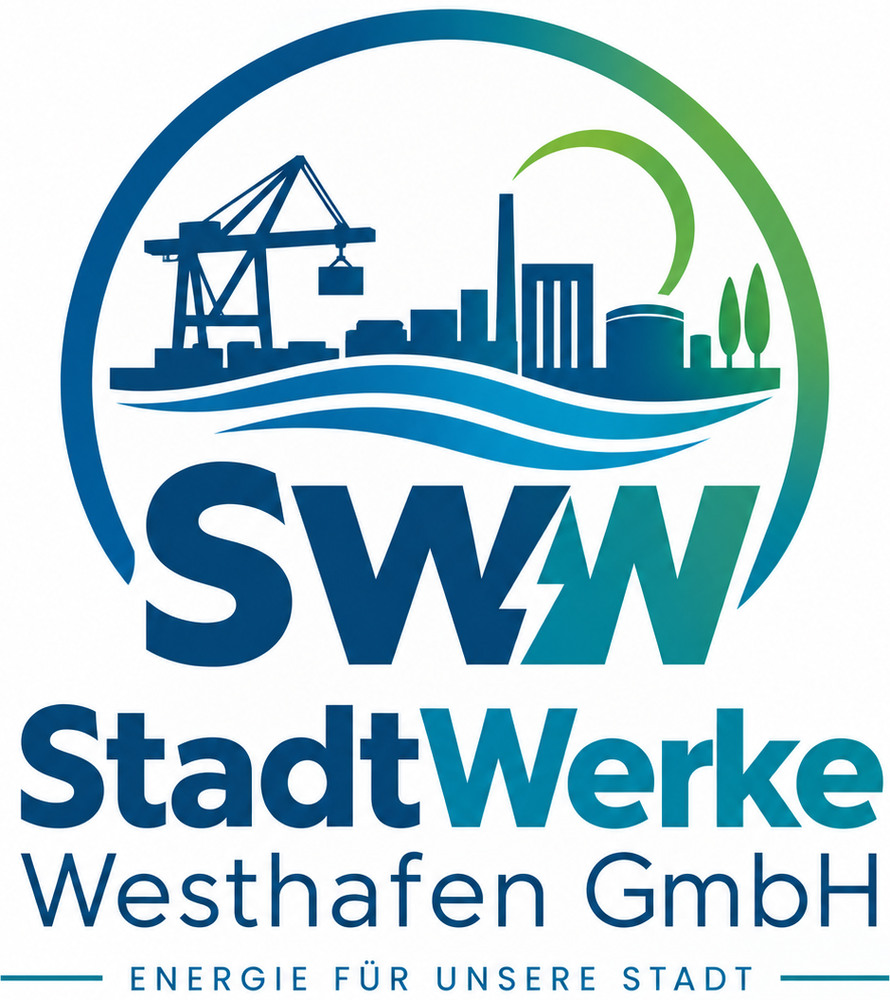

In [79]:
ci.titelkarte(
    "Vom Monatsverbrauch zum prüfbaren Hinweis",
    "Learning-Journey-konforme Modellierung: erklären, vergleichen, entscheiden.",
    "Momentaufnahme des lokalen Projektstands · "
    f"Ausgeführt: {datetime.now(timezone.utc):%d.%m.%Y %H:%M} UTC",
    logo=BASE_DIR / "brand/design-system/assets/logo-sww-full.png",
    metriken=[
        ("Zähler", de(df["zaehler_id"].nunique(), 0)),
        ("Monatswerte", de(len(df), 0)),
        ("Prognosehorizont", "1 Monat"),
    ],
    zeitraum=ci.ZEITRAUM,
)
cards([
    (
        "Meine Verantwortung",
        "Machine Learning",
        "ML Canvas, Modelltraining, Evaluation, Feature Importance und "
        "fachliche Definition der Prüfhinweise.",
    ),
    (
        "Interne Zielgröße",
        "Vollaststunden",
        "Das Modell lernt normiert; jede Prognose wird für die Nutzung wieder "
        "in kWh zurückgerechnet.",
    ),
    (
        "Geschäftsergebnis",
        "Monatliche Entscheidung",
        "Beschaffung erhält eine Prognose. Netzmanagement erhält nach "
        "Monatsabschluss eine priorisierte Prüfliste.",
    ),
])


<details class="sww-story sww-details">
  <summary>So arbeitest du mit diesem Notebook</summary>
  <div class="inside">
    <p><strong>Erster Durchgang:</strong> Lies nur Kapitelüberschriften,
    Diagrammtitel und die vier kurzen Karten unter jedem Plot.</p>
    <p><strong>Zweiter Durchgang:</strong> Öffne „So kannst du es sagen“
    und formuliere die Antwort anschließend ohne Ablesen selbst.</p>
    <p><strong>Technik:</strong> Die Codezellen sind eingeklappt, aber vollständig
    vorhanden. Damit bleibt der Workflow reproduzierbar, ohne die Lernspur zu überladen.</p>
  </div>
</details>


In [80]:
ci.abschnitt(
    "01",
    "Geschäftsfrage und Machine Learning Canvas",
    "Zuerst wird geklärt, wer wann welche Entscheidung treffen soll.",
    kontext="LEARNING JOURNEY / CANVAS",
)


In [81]:
canvas_sections = [
    (
        "01", "Nutzen & Daten", "Warum und womit?",
        "Welches Problem lösen wir – und auf welcher Datengrundlage?",
        [
            (
                1, "Value Proposition", "Mehrwert",
                "Welches Problem lösen wir?",
                "Die Beschaffung erhält vor Monatsbeginn eine belastbarere "
                "Verbrauchsprognose. Das Netzmanagement prüft Auffälligkeiten "
                "monatlich statt erst zum Quartalsende.",
            ),
            (
                2, "Data Sources", "Datenquellen",
                "Welche Rohquellen werden verbunden?",
                "Monatliche Stromverbrauchsdaten je Zähler sowie "
                "Vertragsleistung und Kundentyp; ergänzt durch Kalender, Wetterprognose, "
                "Produktionsplan und geplante Wartung.",
            ),
        ],
    ),
    (
        "02", "Ziel & Signale", "Was soll herauskommen?",
        "Was prognostiziert das System – und was darf es dafür wissen?",
        [
            (
                3, "Prediction", "Vorhersage",
                "Was gibt das Modell konkret aus?",
                "Für jeden Zähler schätzt das Modell die Vollaststunden des "
                "Folgemonats und rechnet sie für die Nutzung in kWh zurück. "
                "Nach Monatsende wird die Abweichung zur Basis des Prüfhinweises.",
            ),
            (
                4, "Features", "Merkmale",
                "Welche Informationen darf das Modell kennen?",
                "Vormonat und Drei-Monats-Mittel, Saison, Arbeits- und Feiertage, "
                "Heizgradtage, Produktionsplan, Wartung und Kundentyp. Verwendet "
                "werden nur vor Monatsbeginn bekannte Angaben.",
            ),
        ],
    ),
    (
        "03", "Modell & Nachweis", "Wie und wie gut?",
        "Wie lernt das Modell – und wann gilt es als besser?",
        [
            (
                5, "Learning Approach", "Lernansatz",
                "Welche Modelle vergleichen wir?",
                "Die lineare Regression ist die erklärbare Referenz. Ein Random "
                "Forest prüft, ob nichtlineare Zusammenhänge messbar helfen. "
                "Die Auswahl erfolgt ausschließlich mit Daten aus 2024.",
            ),
            (
                6, "Evaluation", "Überprüfung",
                "Woran erkennen wir eine bessere Lösung?",
                "RMSE in kWh ist die Hauptmetrik, weil große Mengenfehler stärker "
                "zählen. MAE und R² ergänzen; Vormonat und Drei-Monats-Mittel "
                "bilden die Baselines. 2025 bleibt der spätere Test.",
            ),
        ],
    ),
    (
        "04", "Handlung & Wirkung", "Was folgt daraus?",
        "Wer nutzt das Ergebnis – und wie messen wir den Pilotnutzen?",
        [
            (
                7, "Decision", "Entscheidung",
                "Was geschieht mit dem Ergebnis?",
                "Vor Monatsbeginn nutzt die Beschaffung die kWh-Prognose. Nach "
                "Monatsende erzeugt eine große Abweichung einen priorisierten "
                "Prüfhinweis; die Fachkraft prüft Ursache und Maßnahme.",
            ),
            (
                8, "Impact", "Wirkung",
                "Woran messen wir den Pilotnutzen?",
                "Gemessen werden Prognosefehler, monatliches Hinweisvolumen, "
                "Prüfzeit und Bestätigungsquote. Ein Euro-Effekt wird erst mit "
                "Preis-, Maßnahmen- und Störungsdaten belastbar.",
            ),
        ],
    ),
    (
        "05", "Zeitpunkt & Betrieb", "Wann und wie weiter?",
        "Wann entsteht welches Ergebnis – und wie bleibt es zuverlässig?",
        [
            (
                9, "Prediction Timing", "Vorhersagezeitpunkt",
                "Wann stehen Prognose und Hinweis bereit?",
                "Die Prognose entsteht vor Beginn des Zielmonats. Die "
                "Anomalieprüfung folgt erst nach Eingang des Istwerts. Mit "
                "Monatsdaten ist das bewusst kein Echtzeitsystem.",
            ),
            (
                10, "Monitoring & Maintenance", "Betrieb & Wartung",
                "Wie bleibt die Lösung zuverlässig?",
                "Monatlich werden Prognosefehler, Datenqualität, Hinweisvolumen "
                "und bestätigte Fälle geprüft. Bei anhaltender Verschlechterung "
                "werden Modell und Schwelle neu kalibriert – nicht nach Kalender.",
            ),
        ],
    ),
]
canvas_cards(canvas_sections)
display(HTML(
    '<div class="sww-story sww-canvas-chain">'
    '<span class="label">Kohärenzcheck</span>'
    '<strong>Daten → Vollaststunden → Regression → kWh-Rückrechnung → '
    'Residuum → menschliche Prüfung</strong>'
    '<p>Der Canvas ist kein Modellergebnis, sondern der fachliche Vertrag: '
    'Jeder spätere Modellschritt muss in diese Entscheidungskette passen.</p>'
    '</div>'
))
details(
    "Was bedeuten die fünf Gruppen?",
    [
        "Nutzen & Daten klärt zuerst, für wen die Lösung welchen Mehrwert "
        "schaffen soll und welche Rohquellen dafür vorliegen.",
        "Ziel & Signale trennt die eigentliche Prognose von den Merkmalen, "
        "die zum Prognosezeitpunkt verwendet werden dürfen.",
        "Modell & Nachweis legt Kandidaten, Baselines und messbare "
        "Bewertungskriterien fest.",
        "Handlung & Wirkung beschreibt den menschlichen Entscheidungsprozess "
        "und die KPIs eines späteren Piloten.",
        "Zeitpunkt & Betrieb verhindert die Echtzeit-Verwechslung und legt "
        "Monitoring sowie eine begründete Neukalibrierung fest.",
    ],
)
details(
    "So kannst du den Canvas in drei Sätzen erklären",
    [
        "Wir prognostizieren den Folgemonatsverbrauch je Zähler, damit die "
        "Energiebeschaffung früher planen kann.",
        "Dafür vergleichen wir ein lineares Modell und einen Random Forest über "
        "RMSE, MAE und R² mit einfachen historischen Regeln.",
        "Nach Eintreffen des Istwerts werden große Residuen als Prüfhinweise an "
        "das Netzmanagement übergeben; die Ursache entscheidet ein Mensch.",
    ],
)


In [82]:
cards([
    (
        "Energiebeschaffung",
        "Stefan Lechtenberg",
        "benötigt vor Monatsbeginn eine belastbare Mengenprognose für den Folgemonat.",
    ),
    (
        "Netzmanagement",
        "Anke Bürger",
        "benötigt nach Monatsabschluss priorisierte Hinweise für gezielte Prüfungen.",
    ),
    (
        "Datenanalyse",
        "Henrik Maaß",
        "benötigt eine reproduzierbare Pipeline und eine nachvollziehbare Alertregel.",
    ),
])
display(HTML(
    '<div class="sww-story sww-note"><strong>Wichtige zeitliche Grenze:</strong> '
    'Die Prognose ist vor Monatsbeginn nutzbar. Ein Residuum und damit ein '
    'Anomaliehinweis entsteht erst, wenn der Istwert nach Monatsabschluss vorliegt.'
    '</div>'
))


In [83]:
ci.abschnitt(
    "02",
    "Aufgabentyp, Zielvariable und Merkmale",
    "Die Kernaufgabe ist Regression; die Anomalie entsteht erst aus dem Fehler.",
    kontext="LEARNING JOURNEY / FEATURE ENGINEERING",
)


In [84]:
flow([
    (1, "Merkmale", "Nur Wissen, das vor dem Zielmonat verfügbar ist."),
    (2, "Regression", "Das Modell prognostiziert Vollaststunden."),
    (3, "Rückrechnung", "VLS × Vertragsleistung ergibt kWh."),
    (4, "Residuum", "Ist minus Prognose nach Monatsabschluss."),
    (5, "Prüfhinweis", "Große Abweichungen werden fachlich geprüft."),
])
display(HTML(
    '<div class="sww-story sww-formula">'
    'Vollaststunden = Verbrauch (kWh) ÷ Vertragsleistung (kW)'
    '</div>'
))
vls_example = pd.DataFrame([
    ["Kleiner Anschluss", "100 kW", "150 h", "15.000 kWh"],
    ["Großer Anschluss", "1.000 kW", "150 h", "150.000 kWh"],
], columns=["Beispiel", "Vertragsleistung", "Vollaststunden", "Verbrauch"])
simple_table(vls_example)
plot_decision(
    "Das Zahlenbeispiel zeigt die Normierung ohne mathematischen Fachjargon.",
    "Unterschiedlich große Anschlüsse können denselben relativen Nutzungsgrad haben.",
    "Das Modell lernt VLS; RMSE, MAE, Dashboard und Bericht bleiben in kWh.",
    "VLS sind eine rechnerische Normierung und keine gemessene Maschinenlaufzeit.",
)
details(
    "Prüferfrage: Warum Vollaststunden statt direkt kWh?",
    [
        "Direkte Antwort: Ich gleiche damit unterschiedlich große Anschlüsse auf "
        "einer vergleichbareren Skala an.",
        "Begründung: Derselbe kWh-Wert hat bei 100 kW Anschlussleistung eine andere "
        "Bedeutung als bei 1.000 kW.",
        "Grenze: Es handelt sich nur um eine rechnerische Größe. Für Nutzer und "
        "Bewertung rechne ich jede Prognose wieder in kWh zurück.",
    ],
)


Beispiel,Vertragsleistung,Vollaststunden,Verbrauch
Kleiner Anschluss,100 kW,150 h,15.000 kWh
Großer Anschluss,1.000 kW,150 h,150.000 kWh


In [85]:
feature_contract = pd.DataFrame([
    ["Historie", "Vormonat und Drei-Monats-Mittel", "vor Monatsbeginn bekannt"],
    ["Kalender", "Arbeitstage, Feiertage, Jahreszeit", "vorab bekannt"],
    ["Wetter", "Heizgradtageprognose (Spalte heiztage)", "laut Projektbrief vorab bekannt"],
    ["Betrieb", "Produktionsplan und geplante Wartung", "laut Projektbrief vorab bekannt"],
    ["Stammdaten", "Kundentyp", "stabil bekannt"],
    ["Bewusst ausgeschlossen", "Vorjahresverbrauch", "im Training 2024 nicht verfügbar"],
], columns=["Gruppe", "Verwendete Information", "Zeitliche Verfügbarkeit"])
simple_table(feature_contract)
cards([
    (
        "Feature Engineering",
        "Historie relativieren",
        "Vormonat und Drei-Monats-Mittel werden durch die Vertragsleistung geteilt.",
    ),
    (
        "Saisonalität",
        "Jahreskreis abbilden",
        "Sinus und Kosinus behandeln Dezember und Januar als benachbarte Monate.",
    ),
    (
        "Fehlende Werte",
        "Im Training behandeln",
        "Fehlende Eingaben werden ausschließlich mit dem Median des jeweiligen Trainings ersetzt.",
    ),
])
details(
    "Warum Heizgradtage statt Temperatur verwendet werden",
    [
        f"Temperatur und Heizgradtage enthalten nahezu dieselbe Information "
        f"(Spearman r = {de(temp_heat_corr, 3)}). Die Temperatur hat zudem "
        f"{de(temperature_missing, 0)} fehlende Werte, die Heizgradtage keine.",
        "Im Einklang mit dem EDA-Endfazit bleibt deshalb nur heiztage als "
        "Wettermerkmal. Im Projektbrief wird dieser Wert als zum Monatsbeginn "
        "bekannte Prognoseinformation behandelt.",
        "Die Historie wird direkt aus dem bereinigten Verbrauch neu berechnet: "
        "shift(1) für den Vormonat und ein strikt abgeschlossenes Drei-Monats-Mittel.",
        "Damit ist im Notebook nachvollziehbar, dass kein Wert aus dem Zielmonat "
        "oder aus der Zukunft in ein Historienmerkmal gelangt.",
        "Der Projektbrief setzt Wetterprognose, Produktionsplan und geplante "
        "Wartung am Monatsbeginn als bekannt voraus. Im Realbetrieb müssten "
        "genau diese damaligen Planstände versioniert gespeichert werden.",
    ],
)
details(
    "Wie werden die drei rekonstruierten Zielwerte behandelt?",
    [
        "Die Werte ZL-00218/07-2025, ZL-00278/12-2024 und "
        "ZL-00287/07-2025 bleiben transparent als ziel_rekonstruiert markiert.",
        "Sie werden weder als Trainingsziel noch für Metriken oder als "
        "Anomalie-Ground-Truth verwendet.",
        "In späteren Monaten dürfen sie als bereits bereinigte Historie in "
        "Lag-Merkmale eingehen. Im Betrieb wäre zu diesem Zeitpunkt ebenfalls "
        "nur der bereinigte historische Stand verfügbar. Dadurch kann die "
        "Imputation bis zu drei folgende Historienfenster beeinflussen; diese "
        "kleine Fortschreibung wird nicht als echte Ground Truth ausgegeben.",
    ],
)


Gruppe,Verwendete Information,Zeitliche Verfügbarkeit
Historie,Vormonat und Drei-Monats-Mittel,vor Monatsbeginn bekannt
Kalender,"Arbeitstage, Feiertage, Jahreszeit",vorab bekannt
Wetter,Heizgradtageprognose (Spalte heiztage),laut Projektbrief vorab bekannt
Betrieb,Produktionsplan und geplante Wartung,laut Projektbrief vorab bekannt
Stammdaten,Kundentyp,stabil bekannt
Bewusst ausgeschlossen,Vorjahresverbrauch,im Training 2024 nicht verfügbar


In [86]:
ci.abschnitt(
    "03",
    "Zeitliche Prüfung und faire Modellwahl",
    "Das Modell darf bei keiner Entscheidung Informationen aus der Zukunft sehen.",
    kontext="LEARNING JOURNEY / TRAIN-TEST-SPLIT",
)


In [87]:
timeline = pd.DataFrame([
    ["Prüfung 1 · Lernen", "2024-01-01", "2024-04-30", "Lernen"],
    ["Prüfung 1 · Bewerten", "2024-05-01", "2024-06-30", "Bewerten"],
    ["Prüfung 2 · Lernen", "2024-01-01", "2024-06-30", "Lernen"],
    ["Prüfung 2 · Bewerten", "2024-07-01", "2024-08-31", "Bewerten"],
    ["Prüfung 3 · Lernen", "2024-01-01", "2024-08-31", "Lernen"],
    ["Prüfung 3 · Bewerten", "2024-09-01", "2024-10-31", "Bewerten"],
    ["Schwelle festlegen", "2024-11-01", "2024-12-31", "Kalibrieren"],
    ["Retrospektiver Test", "2025-01-01", "2025-12-31", "Test"],
], columns=["Phase", "Start", "Ende", "Rolle"])
timeline[["Start", "Ende"]] = timeline[["Start", "Ende"]].apply(pd.to_datetime)
fig = px.timeline(
    timeline,
    x_start="Start",
    x_end="Ende",
    y="Phase",
    color="Rolle",
    color_discrete_map={
        "Lernen": theme.ROLE["ist"],
        "Bewerten": theme.TOKENS["teal-500"],
        "Kalibrieren": theme.ROLE["schwellwert"],
        "Test": theme.TOKENS["grey-400"],
    },
)
ci.stil(
    fig,
    "Jede Prüfung liegt zeitlich nach ihrem Training",
    "Drei Modellprüfungen 2024 · separate Schwellenkalibrierung · Testjahr 2025",
    x_titel="Monat",
    y_titel="",
)
fig.update_yaxes(autorange="reversed")
fig.update_xaxes(tickformat="%m/%Y", dtick="M2")
ci.zeigen(fig)
plot_decision(
    "Die Zeitleiste macht Leakage verständlicher als eine technische CV-Tabelle.",
    "Modellwahl, Schwellenkalibrierung und Test erfüllen unterschiedliche Aufgaben.",
    "Hyperparameter werden nur in den ersten zehn Monaten 2024 ausgewählt.",
    "2025 wurde im Projekt bereits angesehen und ist daher ein retrospektiver Test, kein Blindtest.",
)
details(
    "Prüferfrage: Warum kein zufälliger Train-Test-Split?",
    [
        "Direkte Antwort: Weil wir einen zukünftigen Monat aus älteren Monaten prognostizieren.",
        "Begründung: Ein Zufallssplit würde spätere Monate ins Training mischen und die "
        "reale Anwendung zu günstig darstellen.",
        "Grenze: Zwei Jahre sind kurz. Ein prospektiver Pilot bleibt für die "
        "Produktionsfreigabe notwendig.",
    ],
)


In [88]:
NUM_FEATURES = [
    "arbeitstage",
    "feiertage_im_monat",
    "heiztage",
    "produktionsplan_index",
    "wartung_aktiv",
    "lag_1_vls",
    "rolling_3_vls",
    "monat_sin",
    "monat_cos",
]
CAT_FEATURES = ["kundentyp"]
X_COLUMNS = [*NUM_FEATURES, *CAT_FEATURES, "vertragsleistung_kw"]

DIRECT_KWH_NUM_FEATURES = [
    "arbeitstage",
    "feiertage_im_monat",
    "heiztage",
    "produktionsplan_index",
    "wartung_aktiv",
    "lag_1_kwh",
    "rolling_3_kwh",
    "monat_sin",
    "monat_cos",
    "vertragsleistung_kw",
]
DIRECT_KWH_X_COLUMNS = [*DIRECT_KWH_NUM_FEATURES, *CAT_FEATURES]


def make_preprocessor(scale=False):
    numeric_steps = [
        ("impute", SimpleImputer(strategy="median", keep_empty_features=True))
    ]
    if scale:
        numeric_steps.append(("scale", StandardScaler()))
    return ColumnTransformer([
        ("num", Pipeline(numeric_steps), NUM_FEATURES),
        (
            "cat",
            Pipeline([
                ("impute", SimpleImputer(strategy="most_frequent")),
                (
                    "onehot",
                    OneHotEncoder(handle_unknown="ignore", sparse_output=False),
                ),
            ]),
            CAT_FEATURES,
        ),
    ], sparse_threshold=0.0)


class VLSRegressor(RegressorMixin, BaseEstimator):
    '''Fit VLS internally and expose predictions in business unit kWh.'''

    def __init__(self, pipeline):
        self.pipeline = pipeline

    def fit(self, X, y):
        self.pipeline_ = clone(self.pipeline)
        capacity = X["vertragsleistung_kw"].to_numpy(float)
        self.pipeline_.fit(X, np.asarray(y, dtype=float) / capacity)
        return self

    def predict(self, X):
        capacity = X["vertragsleistung_kw"].to_numpy(float)
        prediction_vls = np.clip(self.pipeline_.predict(X), 0, None)
        return prediction_vls * capacity


def linear_estimator():
    return VLSRegressor(Pipeline([
        ("pre", make_preprocessor(scale=True)),
        ("model", LinearRegression()),
    ]))


def forest_estimator(params):
    return VLSRegressor(Pipeline([
        ("pre", make_preprocessor(scale=False)),
        (
            "model",
            RandomForestRegressor(
                n_estimators=300,
                n_jobs=-1,
                random_state=RANDOM_STATE,
                **params,
            ),
        ),
    ]))


def direct_kwh_forest_estimator(params):
    direct_preprocessor = ColumnTransformer([
        (
            "num",
            Pipeline([
                (
                    "impute",
                    SimpleImputer(
                        strategy="median",
                        keep_empty_features=True,
                    ),
                ),
            ]),
            DIRECT_KWH_NUM_FEATURES,
        ),
        (
            "cat",
            Pipeline([
                ("impute", SimpleImputer(strategy="most_frequent")),
                (
                    "onehot",
                    OneHotEncoder(
                        handle_unknown="ignore",
                        sparse_output=False,
                    ),
                ),
            ]),
            CAT_FEATURES,
        ),
    ], sparse_threshold=0.0)
    return Pipeline([
        ("pre", direct_preprocessor),
        (
            "model",
            RandomForestRegressor(
                n_estimators=300,
                n_jobs=-1,
                random_state=RANDOM_STATE,
                **params,
            ),
        ),
    ])


def metrics(actual, predicted):
    actual = np.asarray(actual, dtype=float)
    predicted = np.clip(np.asarray(predicted, dtype=float), 0, None)
    mask = np.isfinite(actual) & np.isfinite(predicted)
    actual, predicted = actual[mask], predicted[mask]
    return {
        "n": int(mask.sum()),
        "RMSE (kWh)": mean_squared_error(actual, predicted) ** 0.5,
        "MAE (kWh)": mean_absolute_error(actual, predicted),
        "R²": r2_score(actual, predicted),
    }


fold_definitions = [
    ("2024-04-01", "2024-05-01", "2024-06-30"),
    ("2024-06-01", "2024-07-01", "2024-08-31"),
    ("2024-08-01", "2024-09-01", "2024-10-31"),
]
folds = []
for train_end, valid_start, valid_end in fold_definitions:
    train_idx = np.flatnonzero(selection["monat"].le(pd.Timestamp(train_end)))
    valid_idx = np.flatnonzero(selection["monat"].between(
        pd.Timestamp(valid_start),
        pd.Timestamp(valid_end),
    ))
    assert (
        selection.iloc[train_idx]["monat"].max()
        < selection.iloc[valid_idx]["monat"].min()
    )
    folds.append((train_idx, valid_idx))

parameter_grid = list(ParameterGrid({
    "max_depth": [8, None],
    "min_samples_leaf": [5, 20],
    "max_features": [0.7, 1.0],
}))


In [89]:
tuning_rows = []
for params in parameter_grid:
    fold_rmse = []
    for train_idx, valid_idx in folds:
        train = selection.iloc[train_idx]
        valid = selection.iloc[valid_idx]
        fitted = forest_estimator(params).fit(
            train[X_COLUMNS],
            train["verbrauch_kwh"],
        )
        prediction = fitted.predict(valid[X_COLUMNS])
        fold_rmse.append(
            metrics(valid["verbrauch_kwh"], prediction)["RMSE (kWh)"]
        )
    tuning_rows.append({
        **params,
        "CV-RMSE (kWh)": np.mean(fold_rmse),
        "Fold-Streuung (kWh)": np.std(fold_rmse, ddof=0),
    })

tuning_results = pd.DataFrame(tuning_rows).sort_values(
    "CV-RMSE (kWh)"
).reset_index(drop=True)
absolute_best_rf = tuning_results.iloc[0]
near_best_rf = tuning_results[
    tuning_results["CV-RMSE (kWh)"].le(
        absolute_best_rf["CV-RMSE (kWh)"]
        * (1 + RF_PARSIMONY_TOLERANCE)
    )
    & tuning_results["max_depth"].notna()
].sort_values("CV-RMSE (kWh)")
recommended_rf = (
    near_best_rf.iloc[0]
    if not near_best_rf.empty
    else absolute_best_rf
)
best_rf_params = {
    key: recommended_rf[key]
    for key in ("max_depth", "min_samples_leaf", "max_features")
}
best_rf_params["max_depth"] = (
    None
    if pd.isna(best_rf_params["max_depth"])
    else int(best_rf_params["max_depth"])
)
best_rf_params["min_samples_leaf"] = int(
    best_rf_params["min_samples_leaf"]
)
best_rf_params["max_features"] = float(best_rf_params["max_features"])
rf_parsimony_cost = (
    recommended_rf["CV-RMSE (kWh)"]
    - absolute_best_rf["CV-RMSE (kWh)"]
)
absolute_depth_label = (
    "unbegrenzt"
    if pd.isna(absolute_best_rf["max_depth"])
    else str(int(absolute_best_rf["max_depth"]))
)
rf_parsimony_cost_label = (
    "weniger als 0,01 kWh"
    if 0 < rf_parsimony_cost < 0.01
    else f"{de(rf_parsimony_cost, 2)} kWh"
)
rf_parsimony_explanation = (
    f"Die begrenzte Baumtiefe {best_rf_params['max_depth']} erzielt bereits "
    "das reine RMSE-Minimum. Die 0,1-%-Toleranzregel bestätigt damit die "
    "einfachere Wahl."
    if np.isclose(rf_parsimony_cost, 0.0)
    else
    f"Das reine RMSE-Minimum hatte die Baumtiefe {absolute_depth_label}. "
    f"Die gewählte Tiefe kostet im mittleren CV nur "
    f"{rf_parsimony_cost_label}. Nach der dokumentierten 0,1-%-Toleranzregel "
    "gewinnt deshalb das einfachere Modell."
)

comparison_rows = []
model_factories = {
    "Lineare Regression": linear_estimator,
    "Random Forest": lambda: forest_estimator(best_rf_params),
}
for fold_number, (train_idx, valid_idx) in enumerate(folds, start=1):
    train = selection.iloc[train_idx]
    valid = selection.iloc[valid_idx]
    for name, factory in model_factories.items():
        fitted = factory().fit(train[X_COLUMNS], train["verbrauch_kwh"])
        prediction = fitted.predict(valid[X_COLUMNS])
        comparison_rows.append({
            "Kandidat": name,
            "Typ": "Modell",
            "Fold": fold_number,
            **metrics(valid["verbrauch_kwh"], prediction),
        })
    for name, column in {
        "Vormonat": "lag_1_kwh",
        "3-Monats-Mittel": "rolling_3_kwh",
    }.items():
        mask = valid[column].notna()
        comparison_rows.append({
            "Kandidat": name,
            "Typ": "Baseline",
            "Fold": fold_number,
            **metrics(
                valid.loc[mask, "verbrauch_kwh"],
                valid.loc[mask, column],
            ),
        })

comparison_detail = pd.DataFrame(comparison_rows)
comparison = (
    comparison_detail.groupby(["Kandidat", "Typ"], as_index=False)
    .agg(
        **{"CV-RMSE (kWh)": ("RMSE (kWh)", "mean")},
        **{"Fold-Streuung (kWh)": (
            "RMSE (kWh)",
            lambda values: values.std(ddof=0),
        )},
        **{"CV-MAE (kWh)": ("MAE (kWh)", "mean")},
        **{"CV-R²": ("R²", "mean")},
    )
    .sort_values("CV-RMSE (kWh)")
    .reset_index(drop=True)
)

linear_rmse = comparison.set_index("Kandidat").loc[
    "Lineare Regression", "CV-RMSE (kWh)"
]
forest_rmse = comparison.set_index("Kandidat").loc[
    "Random Forest", "CV-RMSE (kWh)"
]
forest_gain = 1 - forest_rmse / linear_rmse
selected_name = (
    "Random Forest"
    if forest_gain >= COMPLEXITY_GATE
    else "Lineare Regression"
)
selected_factory = model_factories[selected_name]


In [90]:
ordered = comparison.sort_values("CV-RMSE (kWh)", ascending=False)
fig = go.Figure(go.Bar(
    x=ordered["CV-RMSE (kWh)"],
    y=ordered["Kandidat"],
    orientation="h",
    marker_color=[
        theme.ROLE["prognose"]
        if name == selected_name
        else theme.TOKENS["grey-400"]
        if kind == "Baseline"
        else theme.TOKENS["navy-300"]
        for name, kind in zip(ordered["Kandidat"], ordered["Typ"])
    ],
    error_x=dict(
        type="data",
        array=ordered["Fold-Streuung (kWh)"],
        visible=True,
    ),
    text=[f"{de(value, 0)} kWh" for value in ordered["CV-RMSE (kWh)"]],
    textposition="outside",
    cliponaxis=False,
))
ci.stil(
    fig,
    f"{selected_name} gewinnt die zeitliche Modellwahl",
    "Mittel aus drei Prüfzeiträumen 2024 · Fehlerbalken zeigen die Schwankung",
    x_titel="RMSE (kWh) – niedriger ist besser",
    y_titel="",
)
ci.gitter_x(fig)
ci.zeigen(fig)

best_baseline_cv = comparison[comparison["Typ"].eq("Baseline")].iloc[0]
selected_cv = comparison.set_index("Kandidat").loc[selected_name]
relative_gain_baseline = (
    1
    - selected_cv["CV-RMSE (kWh)"]
    / best_baseline_cv["CV-RMSE (kWh)"]
)
plot_decision(
    "RMSE ist die Journey-nahe Hauptmetrik und bestraft große Planungsfehler stärker.",
    f"{selected_name} erreicht {de(selected_cv['CV-RMSE (kWh)'], 0)} kWh "
    f"gegenüber {de(best_baseline_cv['CV-RMSE (kWh)'], 0)} kWh der besten Baseline.",
    f"Der Forest verbessert die lineare Referenz um "
    f"{de(forest_gain * 100, 1)} % und die beste Baseline um "
    f"{de(relative_gain_baseline * 100, 1)} %; damit erfüllt er das "
    "dokumentierte 5-%-Komplexitätsgate.",
    "Die Fehler schwanken zwischen den Zeitfenstern; deshalb wird kein einzelner Fold überbewertet.",
)
details(
    "Was wurde beim Random Forest tatsächlich abgestimmt?",
    [
        f"Baumtiefe: {best_rf_params['max_depth']}; minimale Blattgröße: "
        f"{best_rf_params['min_samples_leaf']}; Merkmalsanteil: "
        f"{best_rf_params['max_features']}.",
        rf_parsimony_explanation,
        "Es wurden bewusst nur acht Kombinationen geprüft. Die Suche lief "
        "ausschließlich in den ersten zehn Monaten 2024.",
        "Mehr Hyperparameter hätten die Prüfungsgeschichte verlängert, ohne "
        "automatisch einen belastbareren Praxiseinsatz zu liefern.",
    ],
)
details(
    "Prüferfrage: Warum nicht einfach die lineare Regression?",
    [
        f"Die lineare Regression bleibt die verständliche Referenz. Im "
        f"2024-CV senkt der Random Forest den RMSE jedoch um "
        f"{de(forest_gain * 100, 1)} % und überschreitet damit das "
        "dokumentierte 5-%-Gate für zusätzliche Komplexität.",
        "Die Entscheidung wurde mit 2024 getroffen. Dass der Abstand 2025 "
        "kleiner ausfällt, ändert die Auswahl nicht nachträglich, sondern "
        "wird als Unsicherheit berichtet.",
        "Falls Wartbarkeit oder maximale Nachvollziehbarkeit höher gewichtet "
        "werden, ist das lineare Modell ein fachlich vertretbarer Fallback.",
    ],
)


In [91]:
ci.abschnitt(
    "04",
    "Ergebnis auf dem späteren Jahr",
    "Das eingefrorene Modell prognostiziert jeden 2025-Monat jeweils einen Schritt voraus.",
    kontext="LEARNING JOURNEY / EVALUATION",
)


In [92]:
benchmark_predictions = {}
fitted_models = {}
for name, factory in model_factories.items():
    fitted = factory().fit(
        development[X_COLUMNS],
        development["verbrauch_kwh"],
    )
    fitted_models[name] = fitted
    benchmark_predictions[name] = fitted.predict(benchmark[X_COLUMNS])

benchmark_results = []
for name, prediction in benchmark_predictions.items():
    benchmark_results.append({
        "Kandidat": name,
        "Typ": "Modell",
        **metrics(benchmark["verbrauch_kwh"], prediction),
    })
for name, column in {
    "Vormonat": "lag_1_kwh",
    "3-Monats-Mittel": "rolling_3_kwh",
}.items():
    mask = benchmark[column].notna()
    benchmark_results.append({
        "Kandidat": name,
        "Typ": "Baseline",
        **metrics(
            benchmark.loc[mask, "verbrauch_kwh"],
            benchmark.loc[mask, column],
        ),
    })
benchmark_metrics = pd.DataFrame(benchmark_results).sort_values(
    "RMSE (kWh)"
).reset_index(drop=True)
selected_metrics = benchmark_metrics.set_index("Kandidat").loc[selected_name]
best_baseline_test = (
    benchmark_metrics[benchmark_metrics["Typ"].eq("Baseline")]
    .sort_values("RMSE (kWh)")
    .iloc[0]
)
test_gain = (
    1
    - selected_metrics["RMSE (kWh)"]
    / best_baseline_test["RMSE (kWh)"]
)
forest_test_gain_linear = (
    1
    - benchmark_metrics.set_index("Kandidat").loc[
        "Random Forest", "RMSE (kWh)"
    ]
    / benchmark_metrics.set_index("Kandidat").loc[
        "Lineare Regression", "RMSE (kWh)"
    ]
)

ordered = benchmark_metrics.sort_values("RMSE (kWh)", ascending=False)
fig = go.Figure(go.Bar(
    x=ordered["RMSE (kWh)"],
    y=ordered["Kandidat"],
    orientation="h",
    marker_color=[
        theme.ROLE["prognose"]
        if name == selected_name
        else theme.TOKENS["grey-400"]
        if kind == "Baseline"
        else theme.TOKENS["navy-300"]
        for name, kind in zip(ordered["Kandidat"], ordered["Typ"])
    ],
    text=[f"{de(value, 0)} kWh" for value in ordered["RMSE (kWh)"]],
    textposition="outside",
    cliponaxis=False,
))
ci.stil(
    fig,
    f"{selected_name} bleibt 2025 besser als die einfachen Regeln",
    f"Monatlicher One-Step-Ahead-Test · {de(len(benchmark), 0)} echte Zielwerte",
    x_titel="RMSE (kWh) – niedriger ist besser",
    y_titel="",
)
ci.gitter_x(fig)
ci.zeigen(fig)
kpis([
    (f"{de(selected_metrics['RMSE (kWh)'], 0)} kWh", "RMSE · große Fehler zählen stärker"),
    (f"{de(selected_metrics['MAE (kWh)'], 0)} kWh", "MAE · mittlere absolute Abweichung"),
    (de(selected_metrics["R²"], 3), "R² · erklärte Streuung"),
])
plot_decision(
    "Der Balken beantwortet die wichtigste Frage: Ist das Modell besser als eine einfache Regel?",
    f"Der RMSE liegt {de(test_gain * 100, 1)} % unter der besten Baseline.",
    "Das Modell dient als Referenz für Mengenplanung und Residuenanalyse.",
    f"Gegenüber linear beträgt der Vorsprung 2025 nur "
    f"{de(forest_test_gain_linear * 100, 1)} %; zudem bleibt der Test retrospektiv.",
)
details(
    "So kannst du RMSE, MAE und R² erklären",
    [
        "RMSE ist meine Hauptmetrik in kWh. Große Fehler gehen überproportional "
        "ein und sind für Beschaffung und Anomaliehinweise besonders relevant.",
        "MAE ist die durchschnittliche absolute Abweichung pro Zähler-Monat und "
        "reagiert weniger stark auf einzelne Extremwerte.",
        "R² beschreibt, wie viel Streuung das Modell erklärt. Es ist eine "
        "Ergänzung, aber kein direkt verständlicher Fehlerbetrag.",
    ],
)
details(
    "Prüferfrage: Werden für 2025 schon zukünftige Istwerte benutzt?",
    [
        "Nein. Die Modellparameter bleiben nach dem Training auf 2024 "
        "eingefroren. Nur die Featuretabelle wird Monat für Monat aktualisiert.",
        "Für die Prognose eines Monats ist der zuletzt abgeschlossene Istmonat "
        "bereits bekannt. Beispielsweise darf die Dezemberprognose den "
        "November-Istwert verwenden.",
        "Das ist ein monatlicher One-Step-Ahead-Test und keine einmalige "
        "Jahresprognose zum 1. Januar.",
    ],
)
details(
    "Prüferfrage: Ist der Random Forest overfitted?",
    [
        "Direkte Antwort: Es gibt in dieser Auswertung kein klares "
        "Overfitting-Signal, vollständig ausschließen kann ich es aber nicht.",
        "Dafür sprechen drei zeitlich vorwärts laufende Prüfungen, die auf "
        "Tiefe 8 begrenzten Bäume und die weiterhin bessere Leistung im "
        "späteren Jahr 2025.",
        "Dagegen bleibt 2025 ein bereits bekannter retrospektiver Benchmark. "
        "Ein unangesehener prospektiver Pilot ist deshalb vor einer "
        "Produktionsfreigabe erforderlich.",
    ],
)


In [93]:
direct_tuning_rows = []
for params in parameter_grid:
    fold_scores = []
    for train_idx, valid_idx in folds:
        train = selection.iloc[train_idx]
        valid = selection.iloc[valid_idx]
        fitted = direct_kwh_forest_estimator(params).fit(
            train[DIRECT_KWH_X_COLUMNS],
            train["verbrauch_kwh"],
        )
        prediction = fitted.predict(valid[DIRECT_KWH_X_COLUMNS])
        fold_scores.append(
            metrics(valid["verbrauch_kwh"], prediction)
        )
    direct_tuning_rows.append({
        **params,
        "CV-RMSE (kWh)": np.mean([
            score["RMSE (kWh)"] for score in fold_scores
        ]),
        "CV-MAE (kWh)": np.mean([
            score["MAE (kWh)"] for score in fold_scores
        ]),
        "CV-R²": np.mean([score["R²"] for score in fold_scores]),
    })

direct_tuning_results = pd.DataFrame(direct_tuning_rows).sort_values(
    "CV-RMSE (kWh)"
).reset_index(drop=True)
direct_absolute_best = direct_tuning_results.iloc[0]
direct_near_best = direct_tuning_results[
    direct_tuning_results["CV-RMSE (kWh)"].le(
        direct_absolute_best["CV-RMSE (kWh)"]
        * (1 + RF_PARSIMONY_TOLERANCE)
    )
    & direct_tuning_results["max_depth"].notna()
].sort_values("CV-RMSE (kWh)")
direct_recommended = (
    direct_near_best.iloc[0]
    if not direct_near_best.empty
    else direct_absolute_best
)
direct_best_rf_params = {
    "max_depth": (
        None
        if pd.isna(direct_recommended["max_depth"])
        else int(direct_recommended["max_depth"])
    ),
    "min_samples_leaf": int(
        direct_recommended["min_samples_leaf"]
    ),
    "max_features": float(direct_recommended["max_features"]),
}

direct_kwh_model = direct_kwh_forest_estimator(
    direct_best_rf_params
).fit(
    development[DIRECT_KWH_X_COLUMNS],
    development["verbrauch_kwh"],
)
direct_kwh_prediction = direct_kwh_model.predict(
    benchmark[DIRECT_KWH_X_COLUMNS]
)
direct_test_metrics = metrics(
    benchmark["verbrauch_kwh"],
    direct_kwh_prediction,
)
vls_cv_metrics = comparison.set_index("Kandidat").loc[
    "Random Forest"
]
vls_test_metrics = benchmark_metrics.set_index("Kandidat").loc[
    "Random Forest"
]

target_comparison = pd.DataFrame([
    {
        "Zeitraum": "Modellwahl 2024",
        "Zielansatz": "Direkt in kWh gelernt",
        "RMSE (kWh)": direct_recommended["CV-RMSE (kWh)"],
    },
    {
        "Zeitraum": "Modellwahl 2024",
        "Zielansatz": "VLS gelernt, in kWh bewertet",
        "RMSE (kWh)": vls_cv_metrics["CV-RMSE (kWh)"],
    },
    {
        "Zeitraum": "Retrospektiver Test 2025",
        "Zielansatz": "Direkt in kWh gelernt",
        "RMSE (kWh)": direct_test_metrics["RMSE (kWh)"],
    },
    {
        "Zeitraum": "Retrospektiver Test 2025",
        "Zielansatz": "VLS gelernt, in kWh bewertet",
        "RMSE (kWh)": vls_test_metrics["RMSE (kWh)"],
    },
])
cv_target_gain = (
    1
    - vls_cv_metrics["CV-RMSE (kWh)"]
    / direct_recommended["CV-RMSE (kWh)"]
)
test_target_gain = (
    1
    - vls_test_metrics["RMSE (kWh)"]
    / direct_test_metrics["RMSE (kWh)"]
)
test_target_mae_gain = (
    1
    - vls_test_metrics["MAE (kWh)"]
    / direct_test_metrics["MAE (kWh)"]
)

size_labels = ["Q1 klein", "Q2", "Q3", "Q4 groß"]
size_segment = pd.qcut(
    benchmark["vertragsleistung_kw"],
    q=4,
    labels=size_labels,
)
segment_gains = []
vls_test_prediction = benchmark_predictions["Random Forest"]
for segment in size_labels:
    mask = size_segment.eq(segment).to_numpy()
    vls_segment_rmse = metrics(
        benchmark.loc[mask, "verbrauch_kwh"],
        vls_test_prediction[mask],
    )["RMSE (kWh)"]
    direct_segment_rmse = metrics(
        benchmark.loc[mask, "verbrauch_kwh"],
        direct_kwh_prediction[mask],
    )["RMSE (kWh)"]
    segment_gains.append(1 - vls_segment_rmse / direct_segment_rmse)
improved_segments = sum(gain > 0 for gain in segment_gains)

fig = go.Figure()
for target_name, color in [
    ("Direkt in kWh gelernt", theme.TOKENS["grey-400"]),
    ("VLS gelernt, in kWh bewertet", theme.ROLE["prognose"]),
]:
    values = target_comparison[
        target_comparison["Zielansatz"].eq(target_name)
    ]
    fig.add_trace(go.Bar(
        name=target_name,
        x=values["RMSE (kWh)"],
        y=values["Zeitraum"],
        orientation="h",
        marker_color=color,
        text=[
            f"{de(value, 0)} kWh"
            for value in values["RMSE (kWh)"]
        ],
        textposition="outside",
        cliponaxis=False,
    ))
fig.update_layout(barmode="group")
ci.stil(
    fig,
    "Vollaststunden senken den kWh-Fehler in beiden Zeiträumen",
    "Random Forest gegen Random Forest · gleiche Zeitfenster · gleicher Suchraum",
    x_titel="RMSE (kWh) – niedriger ist besser",
    y_titel="",
)
ci.gitter_x(fig)
ci.zeigen(fig)
kpis([
    (
        f"{de(test_target_gain * 100, 1)} %",
        "weniger RMSE im retrospektiven Test 2025",
    ),
    (
        f"{de(test_target_mae_gain * 100, 1)} %",
        "weniger MAE im retrospektiven Test 2025",
    ),
    (
        f"{improved_segments} von {len(size_labels)}",
        "Größenklassen mit geringerem RMSE",
    ),
])
plot_decision(
    "Der A/B-Vergleich isoliert die fachliche Frage: VLS oder direkter kWh-Verbrauch?",
    f"2025 sinkt der RMSE von {de(direct_test_metrics['RMSE (kWh)'], 0)} kWh "
    f"auf {de(vls_test_metrics['RMSE (kWh)'], 0)} kWh; das sind "
    f"{de(test_target_gain * 100, 1)} %. Bereits 2024 beträgt der Vorteil "
    f"{de(cv_target_gain * 100, 1)} %.",
    "Darum bleibt VLS die interne Zielgröße; Ausgabe und Bewertung erfolgen weiterhin in kWh.",
    "Der Vorteil gilt für diesen Datensatz. Er beweist keine allgemeine Überlegenheit von VLS.",
)
details(
    "Was macht diesen A/B-Vergleich fair?",
    [
        "Beide Random Forests sehen dieselben zulässigen Zeilen, dieselben "
        "drei zeitlichen Prüfungen und dieselben fachlichen Informationen.",
        "Die Verbrauchshistorie steht jeweils in der passenden Skala bereit: "
        "VLS-Historie beim VLS-Modell und kWh-Historie beim direkten Modell.",
        "Das direkte kWh-Modell erhält die Vertragsleistung ausdrücklich als "
        "Merkmal. Das VLS-Modell nutzt sie zur Zielbildung und Rückrechnung.",
        "Beide Varianten durchsuchen dieselben acht Hyperparameterkombinationen "
        "und wählen separat ihr bestes ausreichend einfaches Modell.",
        "Am Ende werden beide auf denselben Istwerten in kWh beurteilt. Ein "
        "kleinerer Fehler in VLS allein wäre kein fairer Nachweis.",
    ],
)
details(
    "Prüferfrage: Wurde VLS erst wegen des guten 2025-Ergebnisses gewählt?",
    [
        "Nein. Die Zielentscheidung wird durch den Vergleich in den drei "
        f"2024-Prüfzeiträumen gestützt: {de(vls_cv_metrics['CV-RMSE (kWh)'], 0)} "
        f"statt {de(direct_recommended['CV-RMSE (kWh)'], 0)} kWh RMSE.",
        "Der Wert für 2025 ist nur die spätere retrospektive Bestätigung und "
        "ändert die Auswahl nicht nachträglich.",
        f"Beide Varianten wählen dieselbe Konfiguration: Tiefe "
        f"{best_rf_params['max_depth']}, Blattgröße "
        f"{best_rf_params['min_samples_leaf']} und Merkmalsanteil "
        f"{best_rf_params['max_features']}.",
        "Die Verbesserung zeigt sich in allen vier Größenklassen. Trotzdem "
        "bleibt vor einem Produktiveinsatz ein prospektiver Pilot notwendig.",
    ],
)


In [94]:
final_model = fitted_models[selected_name]
feature_groups = {
    "Verbrauchshistorie": ["lag_1_vls", "rolling_3_vls"],
    "Produktionsplan": ["produktionsplan_index"],
    "Geplante Wartung": ["wartung_aktiv"],
    "Kalender": ["arbeitstage", "feiertage_im_monat"],
    "Jahreszeit": ["monat_sin", "monat_cos"],
    "Wetterprognose": ["heiztage"],
    "Kundentyp": ["kundentyp"],
}
baseline_rmse = metrics(
    benchmark["verbrauch_kwh"],
    final_model.predict(benchmark[X_COLUMNS]),
)["RMSE (kWh)"]
rng = np.random.default_rng(RANDOM_STATE)
importance_rows = []
for group_name, columns in feature_groups.items():
    changes = []
    for _ in range(5):
        row_order = rng.permutation(len(benchmark))
        permuted = benchmark[X_COLUMNS].copy()
        for column in columns:
            permuted[column] = permuted[column].to_numpy()[row_order]
        shuffled_rmse = metrics(
            benchmark["verbrauch_kwh"],
            final_model.predict(permuted),
        )["RMSE (kWh)"]
        changes.append(shuffled_rmse - baseline_rmse)
    importance_rows.append({
        "Featuregruppe": group_name,
        "RMSE-Anstieg (kWh)": np.mean(changes),
    })
importance_frame = pd.DataFrame(importance_rows).sort_values(
    "RMSE-Anstieg (kWh)"
)
fig = go.Figure(go.Bar(
    x=importance_frame["RMSE-Anstieg (kWh)"],
    y=importance_frame["Featuregruppe"],
    orientation="h",
    marker_color=theme.ROLE["ist"],
    text=[
        f"{de(value, 0)} kWh"
        for value in importance_frame["RMSE-Anstieg (kWh)"]
    ],
    textposition="outside",
    cliponaxis=False,
))
ci.stil(
    fig,
    "Historie und Planinformationen tragen die Prognose",
    "Gruppierte Permutation Importance auf dem retrospektiven Testjahr 2025",
    x_titel="RMSE-Anstieg nach zufälligem Mischen (kWh)",
    y_titel="",
)
ci.zeigen(fig)
top_feature = importance_frame.iloc[-1]["Featuregruppe"]
plot_decision(
    "Permutation Importance prüft den Leistungsabfall statt nur interne Baumzählungen zu zeigen.",
    f"{top_feature} verursacht beim Mischen den größten RMSE-Anstieg; "
    "der Kundentyp liefert 2025 keinen stabilen Zusatznutzen.",
    "Zusammengehörige Merkmale werden gemeinsam gemischt und fachlich auf Plausibilität geprüft.",
    "Wichtigkeit ist keine Kausalität; korrelierte Merkmale können Bedeutung untereinander aufteilen.",
)
details(
    "Prüferfrage: Warum ist die Wichtigkeit des Kundentyps leicht negativ?",
    [
        "Beim zufälligen Mischen wurde der Fehler im endlichen Testdatensatz "
        "minimal kleiner. Das wird als ungefähr null und nicht als negativer "
        "kausaler Effekt interpretiert.",
        "Der Kundentyp bleibt als fachlich plausibles Canvas-Merkmal in diesem "
        "Pilotvergleich sichtbar. Bei wiederholt fehlendem Zusatznutzen würde "
        "ich ihn in einer späteren Modellversion entfernen.",
    ],
)


In [95]:
ci.abschnitt(
    "05",
    "Vom Prognosefehler zum Anomaliehinweis",
    "Eine feste, vor 2025 bestimmte Schwelle übersetzt Residuen in Arbeitsaufwand.",
    kontext="LEARNING JOURNEY / RESIDUEN",
)


In [96]:
calibration_parts = []
for month in sorted(calibration["monat"].unique()):
    train = development[development["monat"].lt(month)]
    valid = development[development["monat"].eq(month)].copy()
    rolling_model = selected_factory().fit(
        train[X_COLUMNS],
        train["verbrauch_kwh"],
    )
    valid["prognose_kwh"] = rolling_model.predict(valid[X_COLUMNS])
    calibration_parts.append(valid)
calibration_scored = pd.concat(calibration_parts, ignore_index=True)
calibration_scored["residuum_vls"] = (
    calibration_scored["verbrauch_kwh"]
    - calibration_scored["prognose_kwh"]
) / calibration_scored["vertragsleistung_kw"]
anomaly_threshold = calibration_scored["residuum_vls"].abs().quantile(
    ANOMALY_QUANTILE
)

fig = eda.residual_hist(
    calibration_scored["residuum_vls"],
    anomaly_threshold,
    x_title="Residuum in Vollaststunden",
    nbins=55,
)
ci.stil(
    fig,
    "Nur die äußeren Kalibrierungsfehler lösen später einen Hinweis aus",
    "Rollierende Prognosen für November und Dezember 2024",
    x_titel="Ist-VLS minus Prognose-VLS",
    y_titel="Anzahl",
)
ci.zeigen(fig)
plot_decision(
    "Die Verteilung zeigt, welche Fehler im Kalibrierungszeitraum gewöhnlich oder selten waren.",
    f"Das 99. Perzentil aus {de(len(calibration_scored), 0)} Fällen "
    f"entspricht ±{de(anomaly_threshold, 1)} VLS-Stunden.",
    "Die Schwelle wird als Pilot-Arbeitshypothese eingefroren und erst danach auf 2025 angewendet.",
    "November und Dezember sind eine kurze, winterlastige Kalibrierung – keine robuste Erkennungsqualität.",
)
details(
    "Prüferfrage: Warum wird der Anomaliefehler wieder in VLS betrachtet?",
    [
        "Direkte Antwort: Damit ein Fehler bei einem kleinen und einem großen "
        "Anschluss vergleichbarer wird.",
        "Begründung: Ein absoluter Fehler von 5.000 kWh kann je nach "
        "Vertragsleistung sehr unterschiedlich relevant sein.",
        "Grenze: Auch VLS beseitigen nicht alle Segmentunterschiede. Mit "
        "bestätigten Fällen würde ich segmentbezogene Schwellen prüfen.",
    ],
)
details(
    "Prüferfrage: Reichen zwei Monate für eine belastbare Schwelle?",
    [
        "Nein. Die 1.399 Kalibrierungsfälle liefern eine transparente "
        "Pilotregel, decken aber nur November und Dezember ab.",
        "Beim 99. Perzentil bestimmen nur ungefähr 14 Randfälle die Schwelle; "
        "saisonale und segmentbezogene Unterschiede können damit übersehen werden.",
        "Für den Betrieb würde ich Out-of-Fold-Residuen über mehr Monate sammeln, "
        "Schwellen je sinnvollem Segment prüfen und sie mit bestätigten Fällen validieren.",
    ],
)


In [97]:
selected_prediction = benchmark_predictions[selected_name]
benchmark_scored = benchmark.copy()
benchmark_scored["prognose_kwh"] = selected_prediction
benchmark_scored["residuum_kwh"] = (
    benchmark_scored["verbrauch_kwh"]
    - benchmark_scored["prognose_kwh"]
)
benchmark_scored["residuum_vls"] = (
    benchmark_scored["residuum_kwh"]
    / benchmark_scored["vertragsleistung_kw"]
)

threshold_rows = []
for quantile in (0.95, 0.975, 0.99, 0.995):
    threshold = calibration_scored["residuum_vls"].abs().quantile(quantile)
    count = int(benchmark_scored["residuum_vls"].abs().ge(threshold).sum())
    threshold_rows.append({
        "Perzentil": quantile * 100,
        "Schwelle (VLS-h)": threshold,
        "Hinweise 2025": count,
        "Hinweise je Monat": count / 12,
    })
threshold_table = pd.DataFrame(threshold_rows)

fig = go.Figure(go.Scatter(
    x=threshold_table["Perzentil"],
    y=threshold_table["Hinweise je Monat"],
    mode="lines+markers+text",
    line=dict(color=theme.ROLE["residuum"], width=3),
    marker=dict(size=9),
    text=[de(value, 1) for value in threshold_table["Hinweise je Monat"]],
    textposition="top center",
))
ci.stil(
    fig,
    "Die Schwelle steuert direkt den monatlichen Prüfaufwand",
    "Sensitivitätsanalyse auf dem Testjahr · Schwellen bleiben aus Ende 2024",
    x_titel="Perzentil der Kalibrierungsfehler",
    y_titel="Prüfhinweise je Monat",
)
ci.referenzlinie(
    fig,
    ANOMALY_QUANTILE * 100,
    "gewählte Arbeitshypothese",
    achse="x",
    position="top left",
)
ci.zeigen(fig)
selected_threshold_row = threshold_table.loc[
    np.isclose(threshold_table["Perzentil"], ANOMALY_QUANTILE * 100)
].iloc[0]
plot_decision(
    "Der Plot übersetzt eine abstrakte Schwelle in eine quantifizierbare Fallzahl.",
    f"Beim 99. Perzentil entstehen rund "
    f"{de(selected_threshold_row['Hinweise je Monat'], 1)} Hinweise je Monat.",
    "Das 99. Perzentil wird als dokumentierte Pilotannahme verwendet.",
    "Precision und Recall sind ohne gelabelte reale Störungen nicht berechenbar.",
)


In [98]:
benchmark_scored["anomalie_score"] = (
    benchmark_scored["residuum_vls"].abs() / anomaly_threshold
)
benchmark_scored["anomalie"] = benchmark_scored["anomalie_score"].ge(1.0)
benchmark_scored["richtung"] = np.where(
    benchmark_scored["residuum_vls"].ge(0),
    "ungewöhnlich hoch",
    "ungewöhnlich niedrig",
)
alerts = benchmark_scored[benchmark_scored["anomalie"]].copy()
alert_counts = (
    alerts.groupby(["monat", "richtung"], observed=True)
    .size()
    .unstack(fill_value=0)
    .reindex(
        columns=["ungewöhnlich niedrig", "ungewöhnlich hoch"],
        fill_value=0,
    )
)
fig = go.Figure()
fig.add_trace(go.Bar(
    x=alert_counts.index,
    y=alert_counts["ungewöhnlich niedrig"],
    name="ungewöhnlich niedrig",
    marker_color=theme.TOKENS["red-200"],
))
fig.add_trace(go.Bar(
    x=alert_counts.index,
    y=alert_counts["ungewöhnlich hoch"],
    name="ungewöhnlich hoch",
    marker_color=theme.ROLE["anomalie"],
))
ci.stil(
    fig,
    "Die Pilotregel erzeugt 2025 im Mittel neun Hinweise pro Monat",
    f"{len(alerts)} Hinweise auf {alerts['zaehler_id'].nunique()} Zählern im Jahr 2025",
    x_titel="Monat",
    y_titel="Anzahl Prüfhinweise",
)
fig.update_layout(barmode="stack")
fig.update_xaxes(tickformat="%m/%Y", dtick="M2")
ci.zeigen(fig)
kpis([
    (de(len(alerts), 0), "Prüfhinweise 2025"),
    (de(len(alerts) / 12, 1), "Hinweise je Monat"),
    (de(alerts["zaehler_id"].nunique(), 0), "betroffene Zähler"),
])
high_alerts = int(alerts["richtung"].eq("ungewöhnlich hoch").sum())
low_alerts = int(alerts["richtung"].eq("ungewöhnlich niedrig").sum())
details(
    "Was bedeuten die 109 Hinweise genau?",
    [
        f"Sie entsprechen {de(len(alerts) / len(benchmark_scored) * 100, 2)} % "
        f"der {de(len(benchmark_scored), 0)} bewertbaren Zähler-Monate.",
        f"{high_alerts} Hinweise liegen ungewöhnlich hoch und {low_alerts} "
        "ungewöhnlich niedrig. 103 verschiedene Zähler sind betroffen.",
        "Ein Hinweis kann ein Messproblem, eine Planabweichung, einen "
        "Betriebseffekt oder eine Störung anzeigen. Erst die Fachprüfung "
        "liefert ein belastbares Label.",
    ],
)
plot_decision(
    "Der Monatsverlauf quantifiziert die Fallzahl, bevor ein Fachteam seine Kapazität bestätigt.",
    "Hohe und niedrige Abweichungen werden getrennt sichtbar.",
    "Das Dashboard kann nach Score und zusätzlicher kWh-Auswirkung priorisieren.",
    "Die Balken zeigen Pilot-Hinweise, nicht bestätigte Defekte, Wartungsfälle oder zugesagte Kapazität.",
)


In [99]:
normal_points = benchmark_scored[~benchmark_scored["anomalie"]].copy()
high_points = benchmark_scored[
    benchmark_scored["anomalie"]
    & benchmark_scored["richtung"].eq("ungewöhnlich hoch")
].copy()
low_points = benchmark_scored[
    benchmark_scored["anomalie"]
    & benchmark_scored["richtung"].eq("ungewöhnlich niedrig")
].copy()
axis_max = 1.05 * max(
    benchmark_scored["verbrauch_kwh"].max(),
    benchmark_scored["prognose_kwh"].max(),
)

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=[0, axis_max],
    y=[0, axis_max],
    mode="lines",
    name="Ist = Prognose",
    line=dict(color=theme.ROLE["ist"], width=2, dash="dash"),
    hoverinfo="skip",
))
fig.add_trace(go.Scattergl(
    x=normal_points["prognose_kwh"],
    y=normal_points["verbrauch_kwh"],
    mode="markers",
    name="kein Prüfhinweis",
    marker=dict(
        color=theme.TOKENS["grey-400"],
        size=5,
        opacity=0.28,
    ),
    hovertemplate=(
        "Prognose: %{x:,.0f} kWh<br>"
        "Ist: %{y:,.0f} kWh<extra>kein Prüfhinweis</extra>"
    ),
))
for label, frame, color, symbol in [
    (
        "Prüfhinweis · ungewöhnlich hoch",
        high_points,
        theme.ROLE["anomalie"],
        "triangle-up",
    ),
    (
        "Prüfhinweis · ungewöhnlich niedrig",
        low_points,
        theme.TOKENS["red-700"],
        "triangle-down",
    ),
]:
    fig.add_trace(go.Scatter(
        x=frame["prognose_kwh"],
        y=frame["verbrauch_kwh"],
        mode="markers",
        name=label,
        marker=dict(
            color=color,
            symbol=symbol,
            size=11,
            line=dict(color=theme.TOKENS["surface-card"], width=1),
        ),
        customdata=np.column_stack([
            frame["zaehler_id"],
            frame["monat"].dt.strftime("%m/%Y"),
            frame["residuum_kwh"],
            frame["residuum_vls"],
            frame["anomalie_score"],
        ]),
        hovertemplate=(
            "Zähler %{customdata[0]} · %{customdata[1]}<br>"
            "Prognose: %{x:,.0f} kWh<br>"
            "Ist: %{y:,.0f} kWh<br>"
            "Abweichung: %{customdata[2]:,.0f} kWh<br>"
            "VLS-Residuum: %{customdata[3]:.1f} h<br>"
            "Anomalie-Score: %{customdata[4]:.2f}<extra></extra>"
        ),
    ))
ci.stil(
    fig,
    "Ist gegen Prognose: Abstand zur Diagonalen zeigt den Fehler",
    f"Alle {de(len(benchmark_scored), 0)} Zähler-Monate 2025 · farbig = VLS-Schwelle überschritten",
    x_titel="Modellprognose (kWh)",
    y_titel="Tatsächlicher Verbrauch (kWh)",
)
fig.update_xaxes(range=[0, axis_max], rangemode="tozero")
fig.update_yaxes(range=[0, axis_max], rangemode="tozero")
ci.zeigen(fig)
plot_decision(
    "Jeder Punkt stellt einen Zähler-Monat dar; auf der Diagonalen stimmen Ist und Prognose überein.",
    "Graue Punkte bleiben innerhalb der Pilotregel, farbige Dreiecke überschreiten die VLS-Schwelle.",
    "Die markierten Fälle werden nach Score und kWh-Auswirkung zur fachlichen Prüfung priorisiert.",
    "Der Abstand wird hier in kWh gezeigt, die faire Markierung über Anschlussgrößen erfolgt jedoch in VLS; ein Hinweis ist noch kein bestätigter Defekt.",
)
details(
    "So liest du den Ist-Prognose-Plot in 20 Sekunden",
    [
        "Die waagerechte Achse zeigt die Modellprognose, die senkrechte "
        "Achse den später eingetroffenen Istwert.",
        "Oberhalb der Diagonalen war der Verbrauch höher als erwartet; "
        "unterhalb war er niedriger als erwartet.",
        "Die Farbe entsteht nicht allein aus dem sichtbaren kWh-Abstand. "
        "Für kleine und große Anschlüsse wird die Abweichung zunächst in "
        "Vollaststunden vergleichbar gemacht.",
        "Viele Punkte überlagern sich. Deshalb zeigt der Plot die Lage der "
        "Fälle, aber keine bestätigte Ursache oder Störungshäufigkeit.",
    ],
)


In [100]:
case_row = alerts.loc[alerts["anomalie_score"].idxmax()]
case_id = case_row["zaehler_id"]
case_history = benchmark_scored[
    benchmark_scored["zaehler_id"].eq(case_id)
].sort_values("monat")
case_alerts = case_history[case_history["anomalie"]]
fig = eda.timeseries_forecast(
    case_history["monat"],
    case_history["verbrauch_kwh"],
    case_history["prognose_kwh"],
    anomalien=(case_alerts["monat"], case_alerts["verbrauch_kwh"]),
    y_title="Verbrauch (kWh)",
)
ci.stil(
    fig,
    f"Ein Hinweis wird erst im Kontext zu einem prüfbaren Fall · {case_id}",
    "Automatisch gewählt: höchster normierter VLS-Fehler im Testjahr",
    x_titel="Monat",
    y_titel="Verbrauch (kWh)",
)
fig.update_xaxes(tickformat="%m/%Y", dtick="M2")
ci.zeigen(fig)
case_summary = pd.DataFrame([
    ["Monat", case_row["monat"].strftime("%m/%Y")],
    ["Kundentyp", case_row["kundentyp"]],
    ["Ist", f"{de(case_row['verbrauch_kwh'], 0)} kWh"],
    ["Prognose", f"{de(case_row['prognose_kwh'], 0)} kWh"],
    ["Abweichung", f"{de(case_row['residuum_kwh'], 0)} kWh"],
    ["Anomalie-Score", de(case_row["anomalie_score"], 2)],
    ["Richtung", case_row["richtung"]],
    ["Geplante Wartung", "ja" if case_row["wartung_aktiv"] else "nein"],
], columns=["Merkmal", "Wert"])
simple_table(case_summary)
plot_decision(
    "Die Zeitreihe verbindet den abstrakten Score mit einem realen Prüfablauf.",
    "Istwert, Prognose, Richtung, Wirkung in kWh und Kontext sind gemeinsam sichtbar.",
    "Netzmanagement prüft zuerst Messwert, Plan, Wartung und betriebliche Ursache.",
    "Wartung ist eine Prüfhypothese und keine vom Modell bewiesene Ursache.",
)


Merkmal,Wert
Monat,04/2025
Kundentyp,Gewerbe
Ist,61.629 kWh
Prognose,15.289 kWh
Abweichung,46.340 kWh
Anomalie-Score,"5,06"
Richtung,ungewöhnlich hoch
Geplante Wartung,nein


In [101]:
ci.abschnitt(
    "06",
    "Ergebnisübergabe, Grenzen und Fazit",
    "Der Modellwert entsteht erst durch einen kontrollierten Arbeits- und Lernprozess.",
    kontext="LEARNING JOURNEY / WORKFLOW",
)


In [102]:
flow([
    (1, "Quelle", "Bereinigte CSV mit 700 Zählern."),
    (2, "Import", "Schema und Schlüssel automatisch prüfen."),
    (3, "Bereinigung", "Drei rekonstruierte Ziele kennzeichnen."),
    (4, "Transformation", "VLS, Historie, Saisonalität und trainierte Imputation."),
    (5, "Modellierung", "Baseline, linear, Random Forest, zeitliche Prüfung."),
    (6, "Visualisierung", "Fehler, Einflussgrößen und Residuen erklären."),
    (7, "Übergabe", "Priorisierte Alertliste an das Dashboard."),
])
export_columns = [
    "zaehler_id", "monat", "kundentyp", "verbrauch_kwh",
    "prognose_kwh", "residuum_kwh", "residuum_vls",
    "anomalie_score", "richtung", "wartung_aktiv",
    "produktionsplan_index",
]
dashboard_contract = alerts[export_columns].sort_values(
    ["anomalie_score", "residuum_kwh"],
    ascending=[False, False],
).head(8).copy()
dashboard_contract["monat"] = dashboard_contract["monat"].dt.strftime("%m/%Y")
for column in (
    "verbrauch_kwh", "prognose_kwh", "residuum_kwh",
    "residuum_vls", "anomalie_score", "produktionsplan_index",
):
    dashboard_contract[column] = dashboard_contract[column].map(
        lambda value: de(value, 2)
    )
simple_table(dashboard_contract)
plot_decision(
    "Die Tabelle zeigt die exakte Schnittstelle zwischen ML-Layer und Dashboard.",
    "Jeder Hinweis enthält Identität, Zeitpunkt, Ist, Prognose, Fehler, Score und Kontext.",
    "Das Dashboard sortiert Fälle und dokumentiert die menschliche Bewertung.",
    "Die lokale Demonstration ist keine Live-Anbindung und versendet keine Tickets.",
)


zaehler_id,monat,kundentyp,verbrauch_kwh,prognose_kwh,residuum_kwh,residuum_vls,anomalie_score,richtung,wartung_aktiv,produktionsplan_index
ZL-00307,04/2025,Gewerbe,"61.629,31","15.289,18","46.340,14","785,43","5,06",ungewöhnlich hoch,0,"1,06"
ZL-00618,02/2025,Gewerbe,"99.823,95","25.007,98","74.815,97","712,53","4,59",ungewöhnlich hoch,0,"1,18"
ZL-00084,06/2025,Kommunal,"28.447,37","5.473,51","22.973,85","656,40","4,23",ungewöhnlich hoch,0,"1,09"
ZL-00468,01/2025,Kommunal,"59.099,79","16.591,04","42.508,75","582,31","3,75",ungewöhnlich hoch,0,"1,13"
ZL-00337,12/2025,Industrie,"123.244,47","32.765,99","90.478,48","579,99","3,74",ungewöhnlich hoch,0,"1,03"
ZL-00275,07/2025,Kommunal,"39.348,71","9.859,73","29.488,98","578,22","3,72",ungewöhnlich hoch,0,"0,95"
ZL-00350,04/2025,Industrie,"273.834,39","86.928,77","186.905,62","527,98","3,40",ungewöhnlich hoch,0,"1,09"
ZL-00172,01/2025,Industrie,"232.652,00","69.053,12","163.598,88","526,04","3,39",ungewöhnlich hoch,0,"1,15"


In [103]:
conclusion = [
    (
        "Modell",
        selected_name,
        f"auf 2024 gewählt; 2025-RMSE {de(selected_metrics['RMSE (kWh)'], 0)} kWh",
    ),
    (
        "Zielgröße",
        "Vollaststunden",
        f"{de(test_target_gain * 100, 1)} % weniger 2025-RMSE als direkt kWh",
    ),
    (
        "Baseline",
        str(best_baseline_test["Kandidat"]),
        f"RMSE {de(best_baseline_test['RMSE (kWh)'], 0)} kWh",
    ),
    (
        "Verbesserung",
        f"{de(test_gain * 100, 1)} %",
        "relativ beim RMSE gegenüber der besten einfachen Regel",
    ),
    (
        "Prüfprozess",
        f"{de(len(alerts) / 12, 1)} Hinweise/Monat",
        "simuliertes Pilotvolumen, keine bestätigten Defekte",
    ),
]
cards([
    ("Ergebnis", title, text)
    for _, title, text in conclusion
])
display(HTML(
    '<div class="sww-story sww-note"><strong>Fazit:</strong> '
    'Das Modell prognostiziert einen erwartbaren Monatsverbrauch und '
    'priorisiert anschließend ungewöhnliche Abweichungen. '
    'Das Modell ersetzt keine Abrechnungsentscheidung — es flaggt nur '
    'Untersuchungswürdiges.</div>'
))
details(
    "90-Sekunden-Sprechtext",
    [
        "Meine Verantwortung im Projekt ist der Machine-Learning-Layer: "
        "ML Canvas, Modelltraining, Evaluation, Feature Importance und die "
        "Definition der Anomaliehinweise.",
        "Ich prognostiziere intern Vollaststunden, damit unterschiedlich große "
        "Anschlüsse vergleichbarer werden. Im fairen A/B-Vergleich sinkt der "
        f"2025-RMSE gegenüber direktem kWh-Lernen um "
        f"{de(test_target_gain * 100, 1)} Prozent. Vor der Bewertung rechne "
        "ich jede Prognose wieder in kWh zurück.",
        f"Auf drei zeitlichen Prüfungen 2024 wurde {selected_name} ausgewählt. "
        f"Im späteren Jahr erreicht das Modell {de(selected_metrics['RMSE (kWh)'], 0)} "
        f"kWh RMSE und liegt damit {de(test_gain * 100, 1)} Prozent unter der "
        "besten Baseline.",
        f"Nach Eintreffen des Istwerts markiert eine auf November und Dezember "
        f"2024 kalibrierte VLS-Residuum-Schwelle im Mittel "
        f"{de(len(alerts) / 12, 1)} Fälle pro Monat. Wegen dieser kurzen, "
        "winterlastigen Basis sind das Pilot-Hinweise, keine automatisch "
        "erkannten Defekte.",
        "Im Pilotbetrieb müssen Fachkräfte Ursachen und Entscheidungen "
        "dokumentieren. Erst diese Labels ermöglichen später Precision, Recall "
        "und eine belastbare wirtschaftliche Wirkungskontrolle.",
    ],
)
details(
    "Sechs wahrscheinliche Fachgesprächsfragen",
    [
        "Warum Regression? Weil der Monatsverbrauch eine kontinuierliche Zahl ist.",
        "Warum zeitlicher Split? Weil zukünftige Monate beim Training unbekannt sein müssen.",
        "Warum RMSE? Weil die Kennzahl in kWh bleibt und große Fehler stärker bestraft.",
        f"Warum Vollaststunden? Sie machen Anschlussgrößen vergleichbarer und "
        f"senken den 2025-RMSE im fairen Vergleich um "
        f"{de(test_target_gain * 100, 1)} Prozent; ausgegeben wird weiter kWh.",
        "Warum Random Forest oder lineares Modell? Die Entscheidung folgt dem "
        "2024-Vergleich und einem dokumentierten Komplexitätsgate.",
        "Wie gut erkennt das System echte Defekte? Das ist ohne bestätigte "
        "Anomalielabel noch nicht messbar; aktuell wird nur das Hinweisvolumen quantifiziert.",
    ],
)


<details class="sww-story sww-details">
  <summary>Technischer Ausblick – bewusst nicht Teil der Hauptentscheidung</summary>
  <div class="inside">
    <p>Das separate Notebook <code>20_modeling_optimierung.ipynb</code>
    untersucht zusätzliche Lags, logarithmische Transformationen und
    Gradient Boosting. Diese Varianten sind ein Forschungs- und
    Verbesserungsnachweis, aber keine Voraussetzung für die IHK-Hauptgeschichte.</p>
    <p>Vor einer produktiven Freigabe sind ein prospektiver Schattenbetrieb,
    versionierte Eingabe-Snapshots, Drift-Monitoring und bestätigte
    Anomalielabel erforderlich.</p>
  </div>
</details>
